In [12]:
import pandas as pd
import numpy as np
from collections import Counter
import json
import ast
import pickle
from IPython.display import Image

# Big Data and Data Analytics

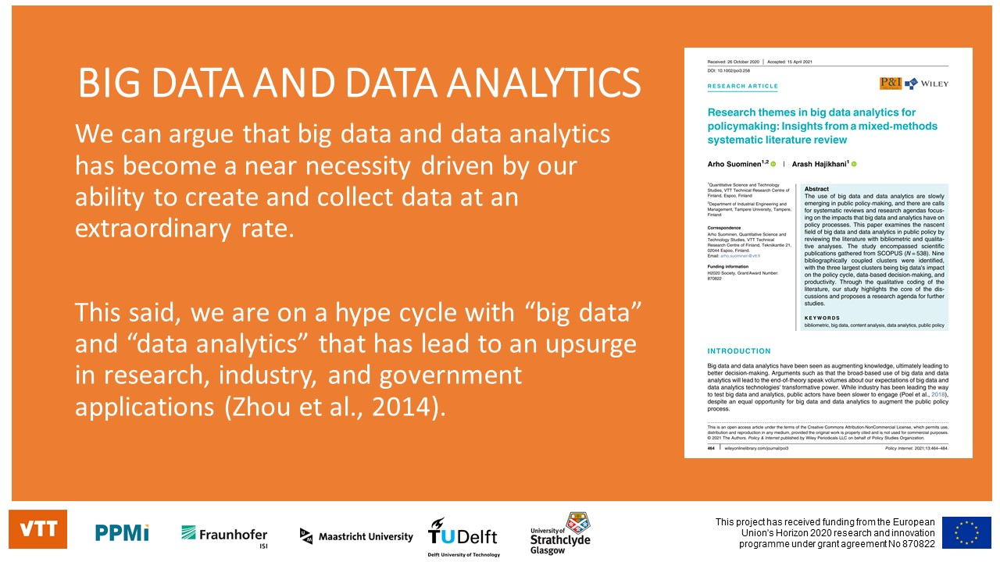

In [3]:
Image("Slide1.jpg", width=900, height=400)

In [4]:
Image(url= "https://cdn.statcdn.com/Infographic/images/normal/17727.jpeg", width=900, height=400)

## Importing the data
The data are going to be explored in this jupyter notebook file, have been stored in a dictionary with a .pkl format. You can download the data through [the DataverseNL](https://dataverse.nl/dataverse/BIGPROD_Data_Sample).<br><br>
It should be noted that the current data sample has been enriched to include company unique identifier from a publicly available company database, namely [7+ Million Company Dataset](https://data.world/peopledatalabs/free-7-million-company-dataset/workspace/file?filename=free_company_dataset.csv) by People Data Labs. You can merge the sample of Bigprod data with the mentioned dataset using the column **website** in the Companies_data dataframe. The following cells explain how the BigProd data can be merged into 7+ Million Company Dataset, and then can be used for innovation studies.

In [13]:
# import the sample of BigProd data
with open("BIGPROD_Public_Data on Dataverse.pkl", 'rb') as handle: # please modify the name of data have been stored in your system
    data = pickle.load(handle)

Import free company data, which is publicly available dataset on companies' inforamation

In [17]:
''' companies data are stored in a dataframe named Companies_data'''
''' using the index column in Companies_data, you can indetify the instances from People Data Labs have been brought in the sample data'''
pdl_data = pd.read_csv('free_company_dataset.csv', on_bad_lines='skip')
pdl_data['website'] = pdl_data['website'].apply(lambda x:'www.'+ str(x))

C:\Users\sasajad\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


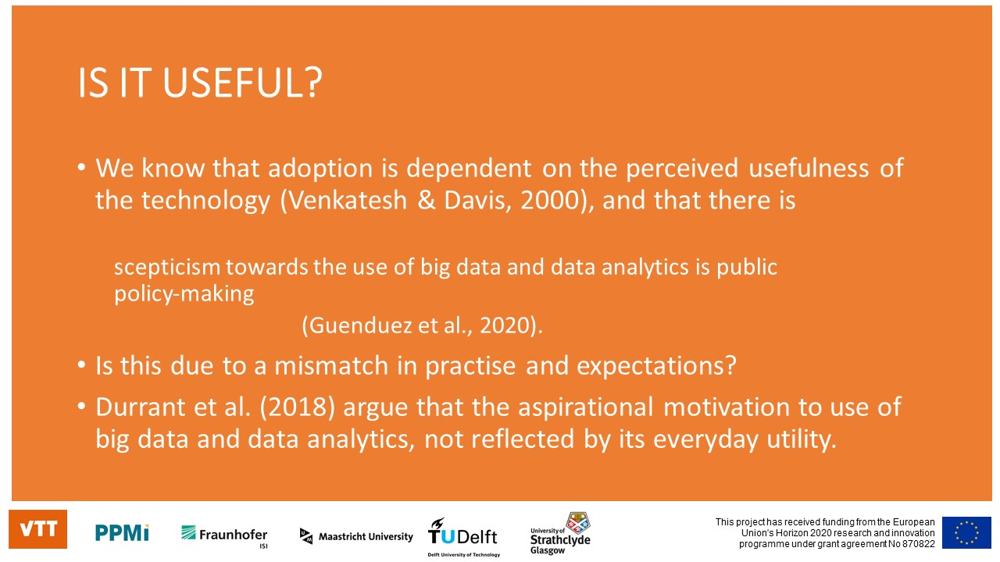

In [5]:
Image("Slide3.jpg", width=900, height=400)

## Presenting the companies data on the sample data
The companies data provided in the sample dataset, contains web mined information which has been scraped from the website. 

In [14]:
data['Companies_data'].head()

,index,website,timestamp,iso,keywords,linked_countries,fos_ids
1,7310779,www.agatex.at,2020-12-07 10:49:01.682842,{'ISO 9001': 'Quality management systems — Req...,"{'refrigerant': 8, 'lubrication': 5, 'leak': 4...","{'AT': 53.333, 'JP': 13.333, 'US': 33.333}","{'526740375': 0.36591893210000004, '2909138624..."
3,6400021,www.hirsch-gruppe.com,2020-12-07 10:49:01.433753,{'ISO 14001': 'Environmental management system...,"{'servo': 56, 'subsidiary': 7, 'insulate mater...","{'AT': 19.13, 'DE': 10.435, 'FR': 6.087, 'HU':...","{'2908645582': 0.24526504200000002, '129968341..."
5,3529765,www.tiger-coatings.com,2020-12-07 10:49:01.798755,{'ISO 1519': 'Paints and varnishes — Bend test...,"{'tiger': 41, 'coating': 14, 'powder coating':...","{'AT': 3.571, 'BG': 3.571, 'BY': 3.571, 'CA': ...","{'91451191': 0.6690263441000001, '2777847177':..."
6,4964177,www.slupetzky.at,2021-06-21 07:24:12.525698,{'ISO 9001': 'Quality management systems — Req...,"{'glass fibre': 9, 'injection moulding': 8, 'i...","{'IE': 8.333, 'US': 8.333, 'AT': 75, 'CH': 8.333}",None
7,5498737,www.dasparfum.com,2021-06-21 07:24:15.183562,None,"{'emotional communication': 2, 'limbic system'...","{'DE': 15.789, 'IT': 10.526, 'AT': 47.368, 'IL...","{'2777883228': 55, '2910242960': 38, '27799517..."


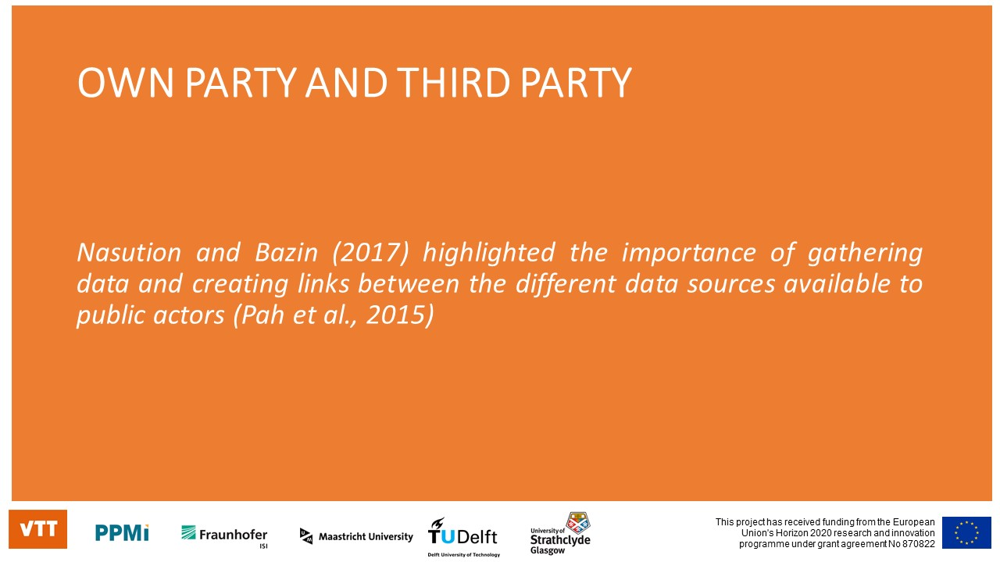

In [6]:
Image("Slide6.jpg", width=900, height=400)

## Merging with People Data Lab data using the website address
By merging the BigProd data with People Data Lab data, users can identify the name of companies, and some other information which is included in that dataset. Identifying the name of enteties enable linking the BigProd sample data, to other firm-level datasets.

In [18]:
companies_data = data['Companies_data'].merge(pdl_data, how = 'left', on = 'website')
companies_data.head()

,index,website,timestamp,iso,keywords,linked_countries,fos_ids,country,founded,id,industry,linkedin_url,locality,name,region,size
0,7310779,www.agatex.at,2020-12-07 10:49:01.682842,{'ISO 9001': 'Quality management systems — Req...,"{'refrigerant': 8, 'lubrication': 5, 'leak': 4...","{'AT': 53.333, 'JP': 13.333, 'US': 33.333}","{'526740375': 0.36591893210000004, '2909138624...",austria,1921.0,agatex-feinchemie-gmbh,chemicals,linkedin.com/company/agatex-feinchemie-gmbh,NaN,agatex feinchemie gmbh,NaN,11-50
1,6400021,www.hirsch-gruppe.com,2020-12-07 10:49:01.433753,{'ISO 14001': 'Environmental management system...,"{'servo': 56, 'subsidiary': 7, 'insulate mater...","{'AT': 19.13, 'DE': 10.435, 'FR': 6.087, 'HU':...","{'2908645582': 0.24526504200000002, '129968341...",austria,1972.0,hirschporozell,plastics,linkedin.com/company/hirschporozell,kärnten,hirsch porozell gmbh,carinthia,501-1000
2,3529765,www.tiger-coatings.com,2020-12-07 10:49:01.798755,{'ISO 1519': 'Paints and varnishes — Bend test...,"{'tiger': 41, 'coating': 14, 'powder coating':...","{'AT': 3.571, 'BG': 3.571, 'BY': 3.571, 'CA': ...","{'91451191': 0.6690263441000001, '2777847177':...",austria,1930.0,tiger-coatings,chemicals,linkedin.com/company/tiger-coatings,wels,tiger coatings gmbh & co. kg,upper austria,1001-5000
3,4964177,www.slupetzky.at,2021-06-21 07:24:12.525698,{'ISO 9001': 'Quality management systems — Req...,"{'glass fibre': 9, 'injection moulding': 8, 'i...","{'IE': 8.333, 'US': 8.333, 'AT': 75, 'CH': 8.333}",None,austria,1953.0,erich-slupetzky-ges.m.b.h,chemicals,linkedin.com/company/erich-slupetzky-ges.m.b.h,oberösterreich,erich slupetzky gmbh,upper austria,11-50
4,5498737,www.dasparfum.com,2021-06-21 07:24:15.183562,None,"{'emotional communication': 2, 'limbic system'...","{'DE': 15.789, 'IT': 10.526, 'AT': 47.368, 'IL...","{'2777883228': 55, '2910242960': 38, '27799517...",austria,1999.0,yogesh-kumar,design,linkedin.com/company/yogesh-kumar,wien,yogesh kumar,vienna,1-10


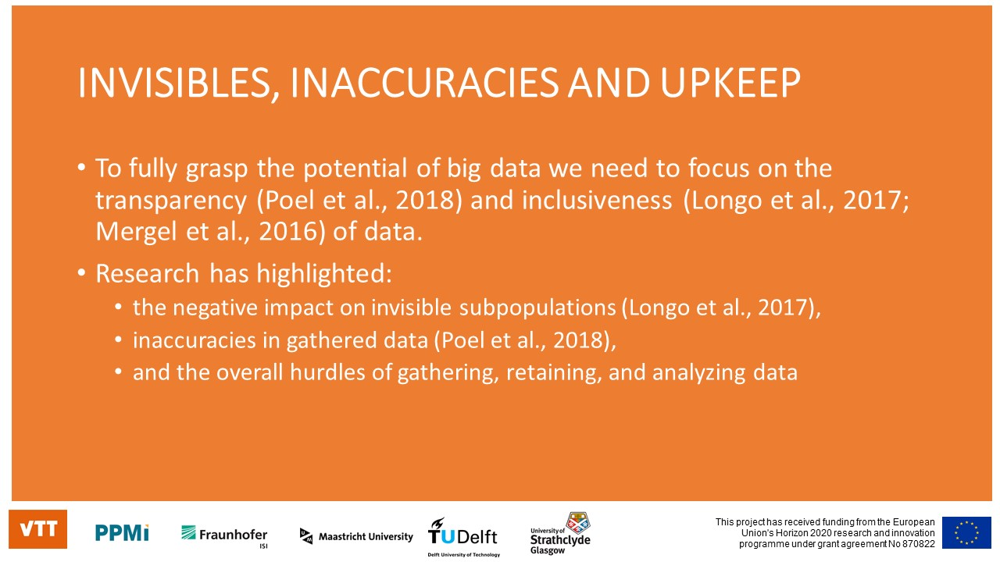

In [7]:
Image("Slide5.jpg", width=900, height=400)

### Visualization
Using Python libraries, users can simply capture intuitions out of the data. For example, the following cells demonstrate the distribution of entities, according to their headquarter country across the Europe and UK. However, there are some errors in the freely available companies data, which gives an alert about the reliability of publicly available data, as users always should be ensured about the accuracy before applying them to any analyses.
The following cell start with the cleaning of the dataset.

In [19]:
companies_data = companies_data[(companies_data['country'] != 'united states') & (companies_data['country'] != 'peru')]
companies_data = companies_data[companies_data['country'].isna() == False]

### Plotly
We use Poltly to demonstrate how the sample companies are distributed across EU+UK

In [20]:
df = companies_data.groupby(['country'], as_index=False).size()

import pycountry
def country(x):
    return pycountry.countries.search_fuzzy(x)[0].alpha_2

df['country1'] = df['country'].apply(lambda x:country(x))

import plotly.express as px
import json
from urllib.request import urlopen
with urlopen('https://raw.githubusercontent.com/leakyMirror/map-of-europe/master/GeoJSON/europe.geojson') as response:
    countries = json.load(response)

max_range = df['size'].max()

figure = px.choropleth_mapbox(df, geojson = countries, locations = 'country1', featureidkey = 'properties.ISO2', color = 'size',
                           color_continuous_scale = "Plasma",
                           range_color = (0, max_range),
                           mapbox_style = "carto-positron", center = {"lat": 54.3233, "lon": 10.1228},
                           zoom=3, opacity=0.5, 
                           width = 700, height = 700, labels={'size':'Number of companies'}
                          ) 
figure.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [8]:
Image(url= "https://upload.wikimedia.org/wikipedia/commons/b/b9/CRISP-DM_Process_Diagram.png", width=600, height=400)

## What is FOS id?
The FOS ids column is related to the vector as a dictionary, showing transforamtion of website text data to FOS. For example, the following company oprating in chemical industry has this FOS ids subset including the id for each fos, and its similarity score

In [21]:
print(companies_data['fos_ids'].iloc[0])

print('\n\n','The company is oprating in','{}'.format(companies_data['industry'].iloc[0]),'industry')

{'526740375': 0.36591893210000004, '2909138624': 0.3492220038, '2779936157': 0.347815712, '153768228': 0.3476541736, '2780643059': 0.3407363017, '2909677094': 0.3383447009, '2778568664': 0.3374375303, '89008666': 0.3351273064, '12731397': 0.32707048, '2910735427': 0.32637271300000004, '68189081': 0.3208319888, '44013972': 0.3189351013, '28292411': 0.3180690311, '2776124570': 0.3162957601, '177987515': 0.3153311502, '2908940802': 0.3141474094, '548895740': 0.3127527279, '2781130449': 0.312746059, '2908946256': 0.3112089515, '2631668': 0.3105392765, '20309002': 0.3100822864, '2780969289': 0.3098344065, '2776364302': 0.309706349, '2909134835': 0.30799109010000003, '168807708': 0.3055978293, '67741611': 0.3053699092, '2777798622': 0.3037655497, '2776197042': 0.3019235078, '2909419283': 0.300663886, '2776250542': 0.3006328907, '65498289': 0.3005822441, '195540742': 0.29960486070000003, '176215080': 0.2975679463, '170573351': 0.29637988730000003, '102142041': 0.2961216611, '47375454': 0.2958

The following cell replaces the FOS ids with the FOS titles

In [22]:
fos_data = data['FOS']

def map_fos(x):
    l=[]
    for i in list(x.keys()):
           l += fos_data[fos_data['fos_id']== i]['fos_name'].tolist()
    
    return dict(zip(l,list(x.values())))
print(map_fos(companies_data['fos_ids'].iloc[0]))

{'Petroleum industry': 0.36591893210000004, 'Industrial Oils': 0.3492220038, 'Base oil': 0.347815712, 'Downstream (petroleum industry)': 0.3476541736, 'Synthetic oil': 0.3407363017, 'Provide (product)': 0.3383447009, 'Polyolester': 0.3374375303, 'Final product': 0.3351273064, 'Upstream (petroleum industry)': 0.32707048, 'Product name': 0.32637271300000004, 'Fossil fuel': 0.3208319888, 'Oil analysis': 0.3189351013, 'Light crude oil': 0.3180690311, 'Residual oil': 0.3162957601, 'Oil reserves': 0.3153311502, 'Product base': 0.3141474094, 'Petroleum': 0.3127527279, 'Motor oil': 0.312746059, 'Ensure (product)': 0.3112089515, 'Gas oil ratio': 0.3105392765, 'Oil refinery': 0.3100822864, 'Product description': 0.3098344065, 'Oil field': 0.309706349, 'Animal oil': 0.30799109010000003, 'Froth treatment': 0.3055978293, 'Product proliferation': 0.3053699092, 'Cycle oil': 0.3037655497, 'Oil cooling': 0.3019235078, 'Commercial Oils': 0.300663886, 'Oil production plant': 0.3006328907, 'Product and ma

## Publication data
The following cell shows the publication data, which have been obtained by linking BigProd companies with publicly available data. Merging the publication data with companies' data using the index columns enables investigating companies' scientific publication activities. Also, studying the FOS ids of publication data set with the companies' FOS id reflected on their website, interestingly can reveal the difference between companies' orientation scientific activities difference and the messages they signal on their website.

In [23]:
publications_data = data['Publications_data']
publications_data.head()

,fos_ids,doi,index
0,"[78390623, 21457203, 127413603, 2982816539, 11...",10.1108/IR.2001.04928DAB.011,2061438
1,"[159985019, 135628077, 155386361, 81988521, 16...",10.4028/WWW.SCIENTIFIC.NET/AMR.605-607.1836,2061438
2,"[153642686, 99862985, 2983492250, 2987536102, ...",10.1016/S0022-2860(03)00514-3,2061438
3,"[78390623, 127413603, 117671659, 21457203, 115...",10.1109/ASMC.2017.7969249,2061438
4,"[2779684419, 127413603, 104806805, 59361812, 1...",10.1034/J.1600-0692.2000.D01-10.X,2061438


In [24]:
### merging the publication data using index column
publications_data.merge(companies_data, on = 'index', how = 'left')

,fos_ids_x,doi,index,website,timestamp,iso,keywords,linked_countries,fos_ids_y,country,founded,id,industry,linkedin_url,locality,name,region,size
0,"[78390623, 21457203, 127413603, 2982816539, 11...",10.1108/IR.2001.04928DAB.011,2061438,www.danieli.com,2020-12-07 10:48:10.565823,{'ISO 9001': 'Quality management systems — Req...,"{'rolling mill': 41, 'mill': 35, 'control syst...","{'AT': 7.692, 'BD': 3.846, 'CN': 3.846, 'DE': ...","{'115244140': 0.2457018494, '2777098346': 0.23...",italy,1914.0,danieli,mechanical or industrial engineering,linkedin.com/company/danieli,florida,danieli,veneto,5001-10000
1,"[159985019, 135628077, 155386361, 81988521, 16...",10.4028/WWW.SCIENTIFIC.NET/AMR.605-607.1836,2061438,www.danieli.com,2020-12-07 10:48:10.565823,{'ISO 9001': 'Quality management systems — Req...,"{'rolling mill': 41, 'mill': 35, 'control syst...","{'AT': 7.692, 'BD': 3.846, 'CN': 3.846, 'DE': ...","{'115244140': 0.2457018494, '2777098346': 0.23...",italy,1914.0,danieli,mechanical or industrial engineering,linkedin.com/company/danieli,florida,danieli,veneto,5001-10000
2,"[153642686, 99862985, 2983492250, 2987536102, ...",10.1016/S0022-2860(03)00514-3,2061438,www.danieli.com,2020-12-07 10:48:10.565823,{'ISO 9001': 'Quality management systems — Req...,"{'rolling mill': 41, 'mill': 35, 'control syst...","{'AT': 7.692, 'BD': 3.846, 'CN': 3.846, 'DE': ...","{'115244140': 0.2457018494, '2777098346': 0.23...",italy,1914.0,danieli,mechanical or industrial engineering,linkedin.com/company/danieli,florida,danieli,veneto,5001-10000
3,"[78390623, 127413603, 117671659, 21457203, 115...",10.1109/ASMC.2017.7969249,2061438,www.danieli.com,2020-12-07 10:48:10.565823,{'ISO 9001': 'Quality management systems — Req...,"{'rolling mill': 41, 'mill': 35, 'control syst...","{'AT': 7.692, 'BD': 3.846, 'CN': 3.846, 'DE': ...","{'115244140': 0.2457018494, '2777098346': 0.23...",italy,1914.0,danieli,mechanical or industrial engineering,linkedin.com/company/danieli,florida,danieli,veneto,5001-10000
4,"[2779684419, 127413603, 104806805, 59361812, 1...",10.1034/J.1600-0692.2000.D01-10.X,2061438,www.danieli.com,2020-12-07 10:48:10.565823,{'ISO 9001': 'Quality management systems — Req...,"{'rolling mill': 41, 'mill': 35, 'control syst...","{'AT': 7.692, 'BD': 3.846, 'CN': 3.846, 'DE': ...","{'115244140': 0.2457018494, '2777098346': 0.23...",italy,1914.0,danieli,mechanical or industrial engineering,linkedin.com/company/danieli,florida,danieli,veneto,5001-10000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7764,"[187107819, 1276947, 2777620619, 121332964, 29...",10.1109/AERO.2006.1655760,547109,www.skytek.com,2020-12-07 10:48:11.492867,None,"{'earth observation': 15, 'international space...","{'CN': 4.167, 'DE': 8.333, 'EE': 8.333, 'ES': ...","{'2777878659': 0.46116731400000005, '77304879'...",ireland,NaN,skytek,information technology and services,linkedin.com/company/skytek,dublin,skytek,dublin,11-50
7765,"[2984607169, 77854861, 201547687, 127413603, 5...",10.1016/0736-5845(84)90076-0,5964458,www.xographtechnologies.com,2020-12-07 10:48:18.820115,{'ISO 11135': 'Sterilization of health-care pr...,"{'injection moulding': 2, 'component part': 1,...",{'GB': 100},"{'65007032': 0.2556549564, '2776916405': 0.253...",united kingdom,NaN,xograph-technologies-limited,medical devices,linkedin.com/company/xograph-technologies-limited,stonehouse,xograph technologies limited,gloucestershire,1-10
7766,"[173608175, 94375191, 103481479, 190715199, 17...",10.1109/TC.1985.1676646,5208677,www.sedecal.com,2020-12-07 10:48:38.636753,{'ISO 13485': 'Medical devices — Quality manag...,"{'molecular imaging': 8, 'ozone': 7, 'x-ray': ...","{'ES': 60, 'HU': 20, 'US': 20}","{'170982647': 0.3112050564, '2910610852': 0.29...",spain,1994.0,sedecal,medical devices,linkedin.com/company/sedecal,algete,sedecal,madrid,1001-5000
7767,"[2778818304, 99508421, 1862650, 2778299597, 27...",10.3389/FNEUR.2017.00635,4517239,www.tyromotion.com,2020-12-07 10:49:01.999325,None,"{'r

## Product data
The sample dataset includes product data, which can be linked to the companies' data using the index column. The product data gives some details about the product, such as product keywords, product FOS and whether it is a trademark or not. Use of product FOS subsets offers investigation of embedded knowledge and technologies of the product, such as digialisation, which is highly significant in manufacturing industries.

In [25]:
products_data = data['Products_data']
products_data.head()

,product_name,is_trademark,product_fos,product_keywords,product_id,index
0,patent applications,False,"{'76681756': 1, '3018471409': 1, '8244735': 1}","[needs analysis, spin out, marking-out, newsle...",P2b0a207f5a,654228
1,export license,False,"{'2780813523': 1, '42012324': 1, '2992181568': 1}","[invitation to treat, exportation]",P61eb24f41e,654228
2,site license,False,"{'2780813523': 1, '42012324': 1, '2992181568': 1}","[invitation to treat, exportation]",Pdf265fbecd,654228
3,Pharmaceutical Manufacturers,False,"{'3018364242': 1, '14733193': 1, '181907467': 1}","[inspector general, open door policy, human se...",Pa031582f0b,654228
4,transmission systems,False,"{'2910624893': 1, '2779602196': 1, '2994569098...","[transmission system, construction equipment, ...",P049ad77559,1645776


## Product Digitalization score
Here, we present the methodology to construct the product digitalization score. This measure explain the extent which compnies promote digital prodcut.<br>
Using product FOS ids, we look for the FOS ids associated with computer science

In [26]:
### Capturing computer science associated FOS ids to calculate the product digitalization score

df_fos = pd.read_parquet("F0_Fos.parquet")
kws = list(set([str(i) for i in df_fos["fos_id"]]))


def check(x):
    try:
        for i in list(x.keys()):
            if i in kws:
                return 1
            else:
                return 0
    except:
        TypeError  

products_data = data['Products_data']
products_data['product_digitalization'] = products_data['product_fos'].apply(lambda x:check(x))

product_digi_score = products_data[['index','product_digitalization']].groupby('index').mean()


product_digi_score = product_digi_score.merge(companies_data[['index','name','country','industry']], how = 'left', on = 'index')
product_digi_score

,index,product_digitalization,name,country,industry
0,2477,0.000000,sempre farby sp. z.o.o.,poland,building materials
1,3734,0.000000,oxford nanosystems ltd.,united kingdom,nanotechnology
2,6964,0.000000,porphychem sas,france,chemicals
3,8711,0.333333,mcs control systems ltd,united kingdom,industrial automation
4,12420,0.500000,tasteone medientechnik gmbh,germany,wholesale
...,...,...,...,...,...
5187,7395065,1.000000,elpa d.o.o.,slovenia,railroad manufacture
5188,7396182,0.000000,ps.,united kingdom,electrical/electronic manufacturing
5189,7396343,0.200000,lindab a/s,denmark,building materials
5190,7398439,0.000000,alca sistemi srl,italy,industrial automation


#### Product digitalization score aggregated and averaged at the country level

In [27]:
df1 = product_digi_score[['product_digitalization','country']].groupby(['country'], as_index=False).mean()

import pycountry
def country(x):
    return pycountry.countries.search_fuzzy(x)[0].alpha_2

df1['country1'] = df1['country'].apply(lambda x:country(x))

figure1 = px.choropleth_mapbox(df1, geojson = countries, locations = 'country1', featureidkey = 'properties.ISO2', color = 'product_digitalization',
                           color_continuous_scale = "mygbm",
                           range_color = (0, 0.25),
                           mapbox_style = "carto-positron", center = {"lat": 54.3233, "lon": 10.1228},
                           zoom=3, opacity=0.5, 
                           width = 700, height = 700, labels={'product_digitalization':'Avg of product digitalization score'}
                          ) 
figure1.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

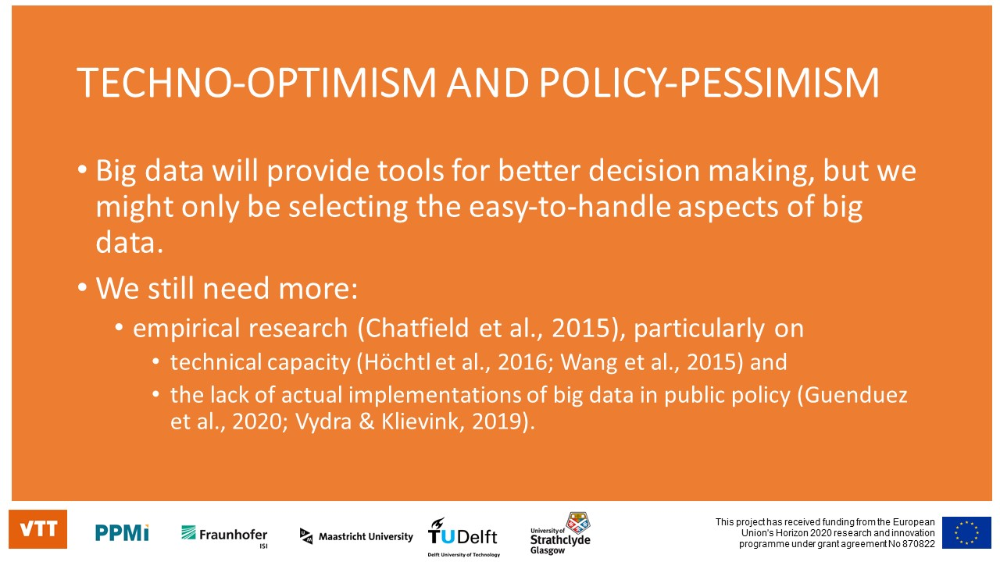

In [9]:
Image("Slide4.jpg", width=900, height=400)

## ANOVA test for product digitalization score based on the industry and country
The ANOVA test examines if there is any significant difference in product digitalization scores at the industry/country level.

In [28]:
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

model = ols("product_digitalization ~ C(industry)", data = product_digi_score).fit()
anova_table = anova_lm(model, typ = 2)
anova_table

C:\Users\sasajad\Anaconda3\lib\site-packages\statsmodels\base\model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 111, but rank is 110



,sum_sq,df,F,PR(>F)
C(industry),19.577001,111.0,4.89113,1.716494e-53
Residual,161.616560,4482.0,NaN,NaN


In [29]:
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

model = ols("product_digitalization ~ C(country)", data = product_digi_score).fit()
anova_table = anova_lm(model, typ = 2)
anova_table

,sum_sq,df,F,PR(>F)
C(country),1.435241,28.0,1.3115,0.126057
Residual,187.954731,4809.0,NaN,NaN


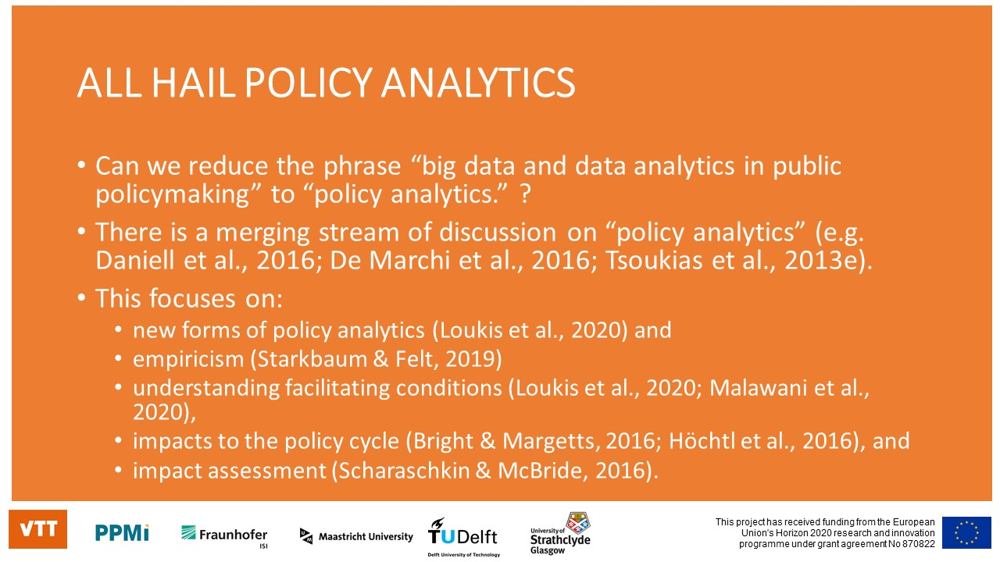

In [10]:
Image("Slide7.jpg", width=900, height=400)

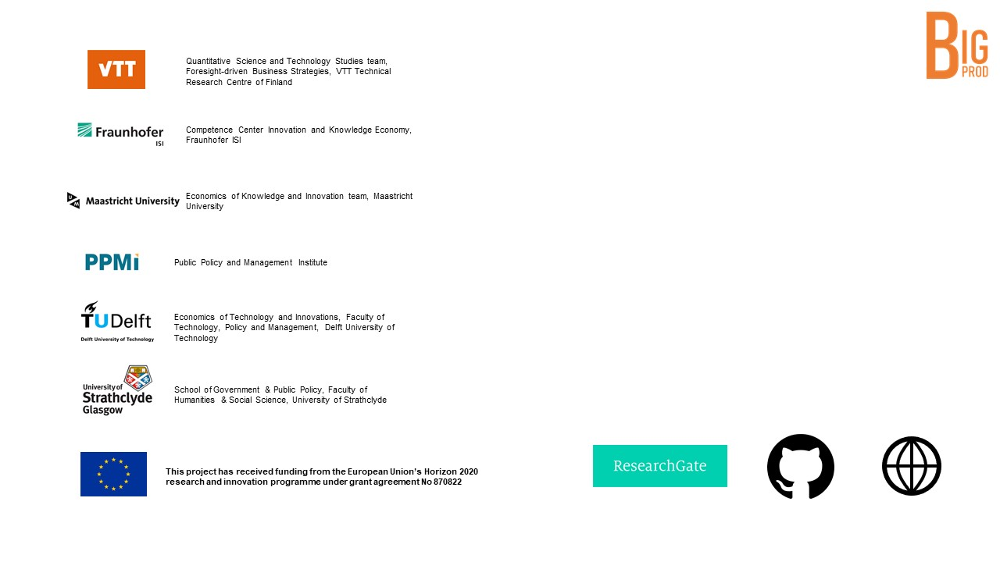

In [11]:
Image("Slide8.jpg", width=900, height=400)